# UMAPs Neurips samples, NK cells

Surface markers + respective RNA

- CLR normalized data

### Reference 1: #

Mustjoki group:
- NK immature: NCAM1(CD56)
- NK activating: NCR1(CD335), KLRK1(CD314), CD2, CD226, 
- NK maturation: B3GAT1 (CD57), 
- NK inhibitory: KIR2DL1 (CD158A), KIR2DL3 (CD158B2), KIR3DL1 (CD158E1)
    
### Reference 2: #

Pfefferle, A., Netskar, H., Ask, E. H., Lorenz, S., Goodridge, J. P., Sohlberg, E., Clancy, T., & Malmberg, K.-J. (2019). A Temporal Transcriptional Map of Human Natural Killer Cell Differentiation. BioRxiv, 630657. https://doi.org/10.1101/630657

From immature to the most mature (adaptive) NK cells:
- CD56 (NCAM1)+
- NKG2A(CD94)+, KIR2DL3(CD158b)−, CD56dim
- NKG2A/KLRC1(CD94)−, KIR2DL3(CD158b)+, CD56dim 
- NKG2A/KLRC1, (CD94)−, KIR2DL3(CD158b)+, NKG2C(CD159c)+, CD56dim (adaptive)

Transition from CD56bright to CD56dim 
- CD96, TIGIT, PVR, CD226, CD161

Clustering analysis: 
- Cluster 1: CD195, CD122, CD132, CD215, CD94
- Cluster 2: CD62L, CD191, CD127, CD27, CD197, CD117, TIGIT
- Cluster 3: CD16, CD38

Two CD56bright populations found in pseudotime analysis, population 1 high:
- KLRB1 (CD161) KLRD1 (CD94), NCAM1 (CD56), CD7, IL15RA (CD215), IL2RB (CD122), IL2RG (CD132), RUNX3 and IKZF2 (Ikaros) expression


## Add corresponding gene names here! 

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [166]:
#CLR normalized protein data, Neurips only

adata_neurips = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [113]:
#Reference 1:
#Surface marker

nk_immature = ['CD56']
nk_activating= ['CD335', 'CD314', 'CD2_prot', 'CD226_prot']
nk_maturation= ['CD57']

nk_all_m=[nk_immature, nk_activating, nk_maturation]

#Corresponding RNA

nk_immature_rna = ['NCAM1']
nk_activating_rna= ['NCR1', 'KLRK1', 'CD2', 'CD226']
nk_maturation_rna= ['B3GAT1']

nk_all_rna_m=[nk_immature_rna, nk_activating_rna, nk_maturation_rna]

In [114]:
#NK cell markers (Reference 2) used in Neurips antibody panel

nk_immature_pfef = ['CD56']
nk56dim = ['CD94','CD158b', 'CD57']

#RNA

nk_immature_pfef_rna = ['NCAM1']
nk56dim_pfef_rna = ['KLRC1', 'KIR2DL3', 'B3GAT1']

# nk_adaptive =['CD158b', 'CD159c, CD57'] CD159c not used in Neurips, so this is same as previous

nk_transition= ['TIGIT_prot', 'CD155', 'CD226', 'CD161'] 

c1_pfef = ['CD195', 'CD122', 'CD94']
c2_pfef = ['CD62L', 'CD127', 'CD27_prot', 'TIGIT_prot']
c3_pfef = ['CD16', 'CD38_prot']

pseudotime= ['CD161', 'CD94', 'CD56', 'CD5', 'CD7', 'CD122']

#RNA

nk_transition_rna= ['TIGIT', 'PVR', 'CD226', 'KLRB1']

c1_pfef_rna = ['CCR5', 'IL2RB', 'KLRD1']
c2_pfef_rna = ['SELL', 'IL7R', 'CD27', 'TIGIT']
c3_pfef_rna = ['FCGR3A', 'CD38']

pseudotime_rna= ['KLRB1', 'KLRD1', 'NCAM1', 'CD5', 'CD7', 'IL2RB']


In [115]:
#Used to check which genes were measured

listOfmarkers= nk56dim_pfef_rna

nk56dim_pfef_rna=[]

for x in listOfmarkers:
    if x in adata_neurips.var_names:
        nk56dim_pfef_rna.append(x)
        
print(nk56dim_pfef_rna)

['KLRC1', 'KIR2DL3', 'B3GAT1']


In [116]:
#Used to check which genes were measured

listOfmarkers= nk_transition_rna

nk_transition_rna=[]

for x in listOfmarkers:
    if x in adata_neurips.var_names:
        nk_transition_rna.append(x)
        
print(nk_transition_rna)

['TIGIT', 'PVR', 'CD226', 'KLRB1']


In [117]:
#Used to check which genes were measured

listOfmarkers= c1_pfef_rna

c1_pfef_rna=[]

for x in listOfmarkers:
    if x in adata_neurips.var_names:
        c1_pfef_rna.append(x)
        
print(c1_pfef_rna)

['CCR5', 'IL2RB', 'KLRD1']


In [118]:
#Used to check which genes were measured

listOfmarkers= c2_pfef_rna

c2_pfef_rna=[]

for x in listOfmarkers:
    if x in adata_neurips.var_names:
        c2_pfef_rna.append(x)
        
print(c2_pfef_rna)

['SELL', 'IL7R', 'CD27', 'TIGIT']


In [119]:
#Used to check which genes were measured

listOfmarkers= c3_pfef_rna

c3_pfef_rna=[]

for x in listOfmarkers:
    if x in adata_neurips.var_names:
        c3_pfef_rna.append(x)
        
print(c3_pfef_rna)

['FCGR3A', 'CD38']


In [120]:
#Used to check which genes were measured

listOfmarkers= pseudotime_rna

pseudotime_rna=[]

for x in listOfmarkers:
    if x in adata_neurips.var_names:
        pseudotime_rna.append(x)
        
print(pseudotime_rna)

['KLRB1', 'KLRD1', 'NCAM1', 'CD5', 'CD7', 'IL2RB']


In [52]:
adata_neurips

AnnData object with n_obs × n_vars = 80998 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [53]:
adata_neurips.var_names

Index(['7SK-1', '7SK-2', 'A1BG', 'A1BG-AS1', 'A2M', 'A2M-AS1', 'A2ML1',
       'A4GALT', 'AAAS', 'AACS',
       ...
       'ZYG11A', 'ZYG11B', 'ZYX', 'ZZEF1', 'ZZZ3', 'bP-21264C1.2',
       'hsa-mir-1199', 'hsa-mir-150', 'hsa-mir-335', 'hsa-mir-8072'],
      dtype='object', length=21720)

In [9]:
adata_neurips.obsm["protein_expression_clr_neurips"]

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,HLA-E,CD82,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,1.532575,0.614600,0.900688,1.389844,0.918109,0.0,0.0,0.0,0.0,0.0
CTCAAGAGTCACAGAG-1-s4d1,0.652674,1.069339,1.657770,0.890243,1.377072,1.264995,1.863027,1.101769,1.562259,1.072649,...,1.283465,0.614600,1.786480,0.762359,1.112478,0.0,0.0,0.0,0.0,0.0
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.344431,0.353792,0.860303,0.979461,1.147198,0.0,0.0,0.0,0.0,0.0
CGTGATAGTTATCTGG-1-s4d1,0.000000,1.249182,1.335424,1.256332,2.674106,1.322314,0.289336,1.240123,1.397398,1.525053,...,0.859205,1.527772,0.629556,0.854928,1.000442,0.0,0.0,0.0,0.0,0.0
AGATCCAAGATCGGTG-1-s4d1,2.784459,1.132949,1.674846,1.669058,1.663981,2.101246,2.112640,1.417276,1.884321,1.861734,...,1.429432,1.031029,2.808629,2.007436,2.064066,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTGGTTAGTCGAGTTT-1-s1d3,0.000000,0.175083,0.734526,0.000000,0.505917,1.235054,1.241451,0.512721,0.502246,1.766372,...,0.374154,0.425643,0.519947,0.484666,0.497623,0.0,0.0,0.0,0.0,0.0
GCTACAACAGTGCGCT-1-s1d3,0.378666,0.453643,0.894450,0.000000,0.766577,1.058199,1.529611,0.512721,0.663922,1.766372,...,1.074485,0.100854,1.415230,0.854928,0.560915,0.0,0.0,0.0,0.0,0.0
AACAAAGGTTGGTACT-1-s1d3,0.378666,0.324031,1.094684,0.306698,0.401377,1.983838,2.156735,0.512721,0.835018,2.400949,...,1.149104,1.324148,1.315806,0.605141,0.357584,0.0,0.0,0.0,0.0,0.0
TGACAGTCATGGCTGC-1-s1d3,0.378666,0.764571,0.776968,0.306698,0.152401,1.358780,1.753042,0.201533,0.586348,1.543085,...,1.373575,0.276377,1.113769,0.660339,0.960123,0.0,0.0,0.0,0.0,0.0


In [10]:
adata_neurips.obs['cell_type'].unique().tolist()

['NK',
 'CD8+ T CD69+ CD45RA+',
 'NK CD158e1+',
 'HSC',
 'CD14+ Mono',
 'B1 B IGKC+',
 'CD4+ T activated',
 'CD8+ T CD69+ CD45RO+',
 'G/M prog',
 'Naive CD20+ B IGKC-',
 'CD8+ T CD49f+',
 'Naive CD20+ B IGKC+',
 'CD4+ T naive',
 'CD8+ T naive',
 'CD4+ T activated integrinB7+',
 'cDC2',
 'gdT TCRVD2+',
 'CD8+ T TIGIT+ CD45RO+',
 'CD16+ Mono',
 'Erythroblast',
 'MAIT',
 'T reg',
 'gdT CD158b+',
 'Transitional B',
 'Proerythroblast',
 'CD8+ T CD57+ CD45RO+',
 'Plasmablast IGKC+',
 'ILC1',
 'Lymph prog',
 'ILC',
 'MK/E prog',
 'Normoblast',
 'CD8+ T CD57+ CD45RA+',
 'pDC',
 'B1 B IGKC-',
 'Plasma cell IGKC-',
 'Plasmablast IGKC-',
 'Plasma cell IGKC+',
 'CD8+ T TIGIT+ CD45RA+',
 'CD8+ T naive CD127+ CD26- CD101-',
 'CD4+ T CD314+ CD45RA+',
 'cDC1',
 'T prog cycling',
 'dnT']

In [11]:
#Select only NK cells

neurips_nk=adata_neurips[adata_neurips.obs['cell_type'] == "NK CD158e1+"]

In [12]:



neurips_nk = adata_neurips[(adata_neurips.obs['cell_type'] == "NK") | (adata_neurips.obs['cell_type'] == "NK CD158e1+")]

In [13]:
neurips_nk

View of AnnData object with n_obs × n_vars = 7388 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [14]:
neurips_nk_prot=neurips_nk.obsm['protein_expression_clr_neurips']

In [15]:
neurips_nk_prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,HLA-E,CD82,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,1.532575,0.614600,0.900688,1.389844,0.918109,0.0,0.0,0.0,0.0,0.0
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.344431,0.353792,0.860303,0.979461,1.147198,0.0,0.0,0.0,0.0,0.0
GCAACATTCGCAAGAG-1-s4d1,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,1.072649,...,1.218539,0.670407,0.329073,1.280509,0.676616,0.0,0.0,0.0,0.0,0.0
TCACGGGTCGCACGAC-1-s4d1,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,0.812797,...,1.456232,0.614600,0.576253,1.189870,1.000442,0.0,0.0,0.0,0.0,0.0
CGCCAGAAGACCATTC-1-s4d1,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,0.849218,...,1.556781,0.276377,0.680162,1.415407,0.729806,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,0.288523,...,1.556781,0.353792,0.519947,0.809714,0.357584,0.0,0.0,0.0,0.0,0.0
ACATTTCCAGCAGTGA-1-s1d3,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,0.652195,...,0.950948,0.555495,0.519947,0.546717,0.194691,0.0,0.0,0.0,0.0,0.0
TGAGACTTCCTTCAGC-1-s1d3,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,0.406586,...,0.374154,0.492675,0.396827,0.418509,0.000000,0.0,0.0,0.0,0.0,0.0
GAGATGGTCCGCCTAT-1-s1d3,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,0.406586,...,1.532575,0.555495,0.576253,0.546717,0.430053,0.0,0.0,0.0,0.0,0.0


In [16]:
neurips_nk_prot=neurips_nk_prot.rename(columns={'CD2': 'CD2_prot'})

In [17]:
neurips_nk_prot["CD2_prot"]

GTAGTACCAATCCTTT-1-s4d1    2.061384
CTGTGGGTCATGCGGC-1-s4d1    1.437363
GCAACATTCGCAAGAG-1-s4d1    2.688777
TCACGGGTCGCACGAC-1-s4d1    0.256021
CGCCAGAAGACCATTC-1-s4d1    1.734922
                             ...   
ATCATTCGTCCAATCA-1-s1d3    2.335727
ACATTTCCAGCAGTGA-1-s1d3    1.963944
TGAGACTTCCTTCAGC-1-s1d3    0.000000
GAGATGGTCCGCCTAT-1-s1d3    2.668747
ACCTGTCTCACAGTGT-1-s1d3    3.143087
Name: CD2_prot, Length: 7388, dtype: float64

In [18]:
#To exclude columns that contain only zeros

neurips_nk_prot = pd.DataFrame(neurips_nk_prot)
neurips_nk_prot != 0
(neurips_nk_prot != 0).any(axis=0)
neurips_nk_prot.loc[:, (neurips_nk_prot != 0).any(axis=0)]
neurips_nk_prot = neurips_nk_prot.loc[:, (neurips_nk_prot != 0).any(axis=0)]

In [19]:
samples=adata_neurips.obs['POOL'].unique().tolist()
samples
    

['s4d1',
 's3d6',
 's1d2',
 's2d1',
 's3d7',
 's2d4',
 's1d1',
 's4d9',
 's4d8',
 's2d5',
 's3d1',
 's1d3']

In [20]:
#Surface marker

nk_immature = ['CD56']
nk_activating= ['CD335', 'CD314', 'CD2_prot', 'CD226_prot']
nk_maturation= ['CD57']

nk_all=[nk_immature, nk_activating, nk_maturation]

#Corresponding RNA

nk_immature_rna = ['NCAM1']
nk_activating_rna= ['NCR1', 'KLRK1', 'CD2', 'CD226']
nk_maturation_rna= ['B3GAT1']

nk_all_rna=[nk_immature_rna, nk_activating_rna, nk_maturation_rna]

In [21]:
nk_all_rna=[nk_immature_rna, nk_activating_rna, nk_maturation_rna]

nk_all_rna

[['NCAM1'], ['NCR1', 'KLRK1', 'CD2', 'CD226'], ['B3GAT1']]

In [22]:
nk_all_rna=list(np.concatenate(nk_all_rna).flat)

In [23]:
adata_neurips.var_names

Index(['7SK-1', '7SK-2', 'A1BG', 'A1BG-AS1', 'A2M', 'A2M-AS1', 'A2ML1',
       'A4GALT', 'AAAS', 'AACS',
       ...
       'ZYG11A', 'ZYG11B', 'ZYX', 'ZZEF1', 'ZZZ3', 'bP-21264C1.2',
       'hsa-mir-1199', 'hsa-mir-150', 'hsa-mir-335', 'hsa-mir-8072'],
      dtype='object', length=21720)

In [24]:
#Check is genes are in the var_names

listOfGenes = nk_all_rna
nk_all_rna=[]

for x in listOfGenes:
    if x in adata_neurips.var_names:
        print(x, "Yes")
        nk_all_rna.append(x)
    else:
        print(x, "No") 
        

NCAM1 Yes
NCR1 Yes
KLRK1 Yes
CD2 Yes
CD226 Yes
B3GAT1 Yes


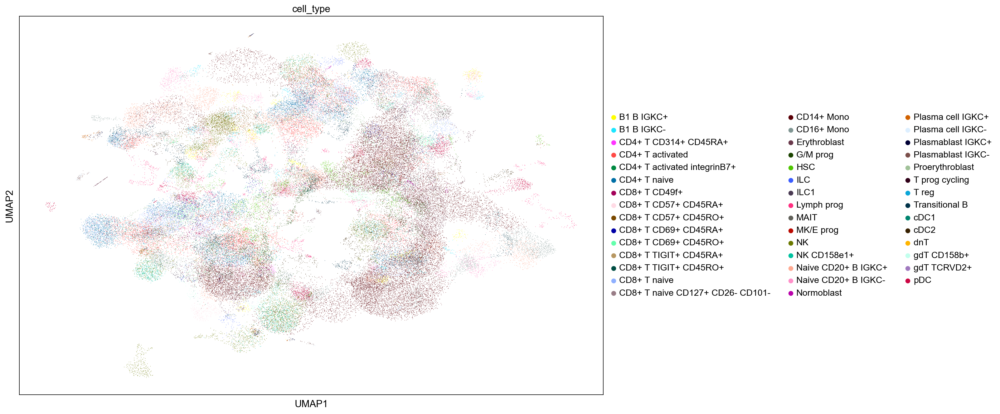

In [25]:
#Whole Neurips dataset plotted

sc.set_figure_params(figsize=(15, 10))

sc.pl.umap(adata_neurips, color = ['cell_type'], color_map = 'viridis')

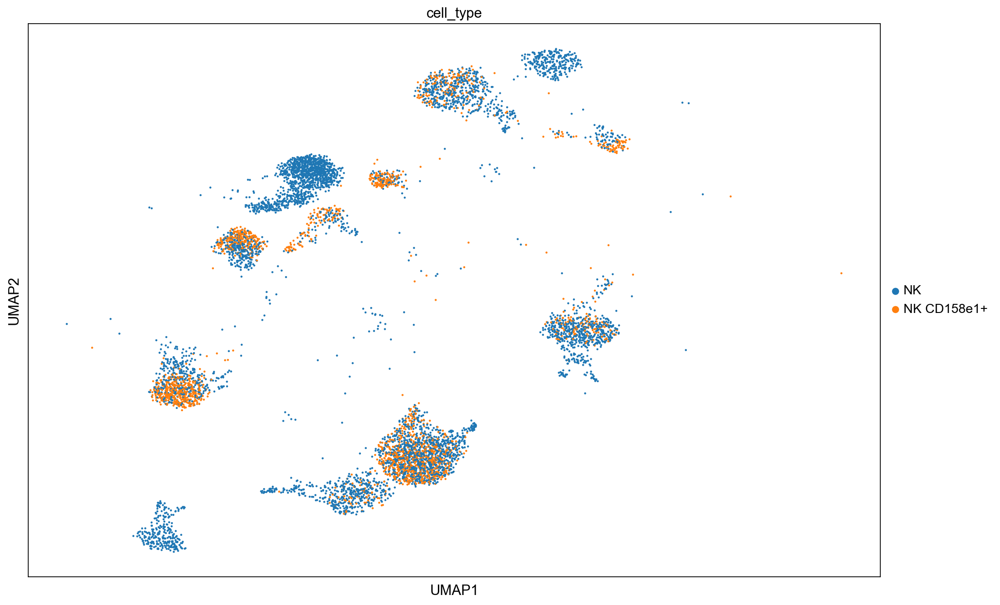

In [26]:
#Only NK cells plotted

sc.pl.umap(neurips_nk, color = ['cell_type'], color_map = 'viridis')

## Reference 1 markers

###  Surface marker #

- nk_immature = ['CD56']
- nk_activating= ['CD335', 'CD314', 'CD2_prot', 'CD226_prot']
- nk_maturation= ['CD57']

- nk_all_m=[nk_immature, nk_activating, nk_maturation]

### Corresponding RNA #

- nk_immature_rna = ['NCAM1']
- nk_activating_rna= ['NCR1', 'KLRK1', 'CD2', 'CD226']
- nk_maturation_rna= ['B3GAT1']

- nk_all_rna_m=[nk_immature_rna, nk_activating_rna, nk_maturation_rna]

In [143]:
#selecting one sample

s1d1=adata_neurips[adata_neurips.obs['POOL'] == "s1d1"]

In [144]:
prot=eg.obsm['protein_expression_clr_neurips']

In [145]:
prot=prot.rename(columns={'CD2': 'CD2_prot', 'CD226':'CD226_prot', 'TIGIT':'TIGIT_prot', 'CD27':'CD27_prot', 'CD38': 'CD38_prot'})

In [146]:
eg=s1d1

    
a = eg.obs
b = prot


adata_eg=pd.concat([a, b], axis=1)
s1d1.obs=adata_eg

In [147]:
prot["CD62L"]

TACAGGTGTTAGAGTA-1-s1d1    3.169630
AGGATCTAGGTCTACT-1-s1d1    1.642967
GTAGAAAGTGACACAG-1-s1d1    0.245322
GACCAATCAATTTCGG-1-s1d1    0.000000
TTCCGGTAGTTGTAAG-1-s1d1    2.643869
                             ...   
GTCGAATAGTTTCGGT-1-s1d1    1.400779
AGTAGTCTCTGGGCGT-1-s1d1    0.245322
GCCCGAAGTATGGAGC-1-s1d1    3.932724
CTACATTAGCGCGTTC-1-s1d1    3.133953
GATTCTTTCACCCATC-1-s1d1    0.442160
Name: CD62L, Length: 4123, dtype: float64

In [148]:
sample_nk = s1d1[(s1d1.obs['cell_type'] == "NK") | (s1d1.obs['cell_type'] == "NK CD158e1+")]

Index(['7SK-1', '7SK-2', 'A1BG', 'A1BG-AS1', 'A2M', 'A2M-AS1', 'A2ML1',
       'A4GALT', 'AAAS', 'AACS',
       ...
       'ZYG11A', 'ZYG11B', 'ZYX', 'ZZEF1', 'ZZZ3', 'bP-21264C1.2',
       'hsa-mir-1199', 'hsa-mir-150', 'hsa-mir-335', 'hsa-mir-8072'],
      dtype='object', length=21720)

In [ ]:
sample_nk

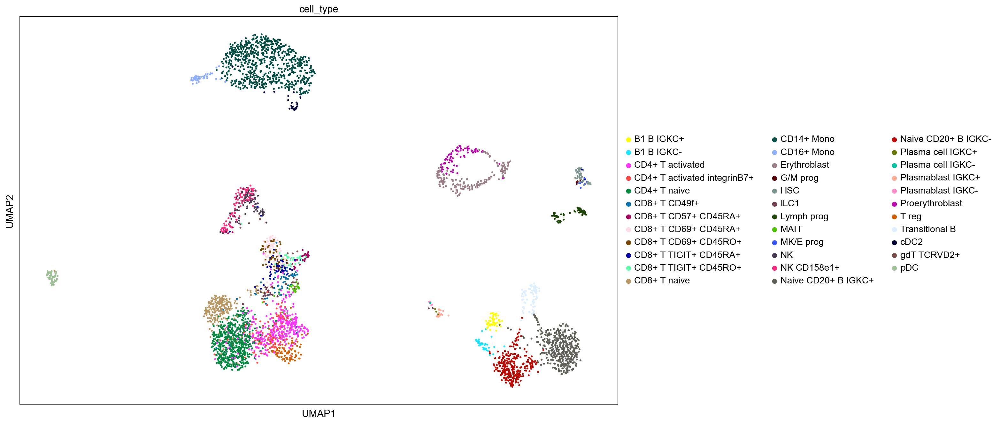

In [136]:
#One sample

sc.set_figure_params(figsize=(15, 10))
sc.pl.umap(s1d1, color = ['cell_type'], color_map = 'viridis')

In [137]:
prot=prot.rename(columns={'CD2': 'CD2_prot', 'CD226':'CD226_prot', 'TIGIT':'TIGIT_prot'})

In [138]:
prot["CD2_prot"]

TACAGGTGTTAGAGTA-1-s1d1    1.734922
AGGATCTAGGTCTACT-1-s1d1    0.136182
GTAGAAAGTGACACAG-1-s1d1    2.774255
GACCAATCAATTTCGG-1-s1d1    0.136182
TTCCGGTAGTTGTAAG-1-s1d1    0.363024
                             ...   
GTCGAATAGTTTCGGT-1-s1d1    0.136182
AGTAGTCTCTGGGCGT-1-s1d1    4.168340
GCCCGAAGTATGGAGC-1-s1d1    3.712935
CTACATTAGCGCGTTC-1-s1d1    0.838550
GATTCTTTCACCCATC-1-s1d1    0.459676
Name: CD2_prot, Length: 4123, dtype: float64

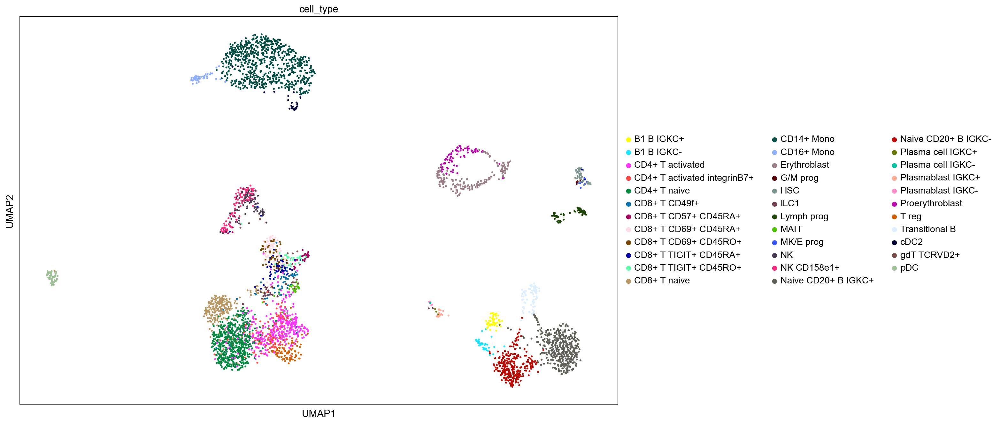

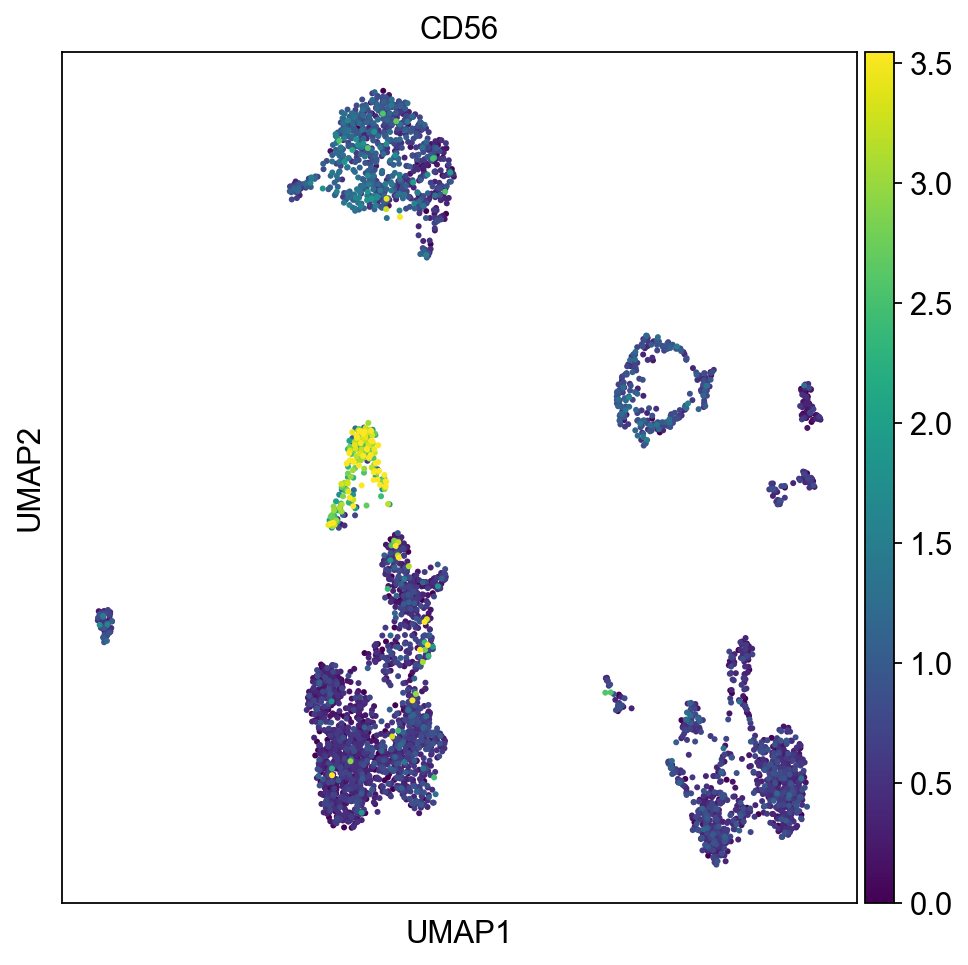

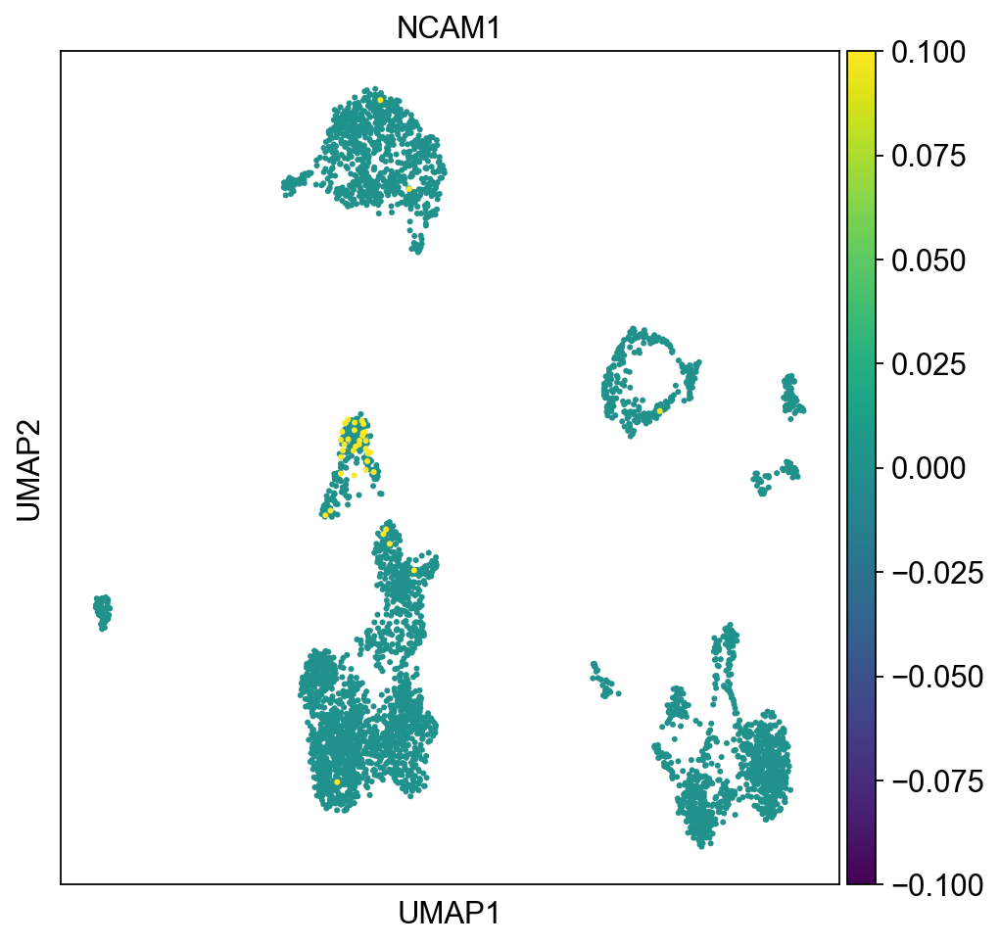

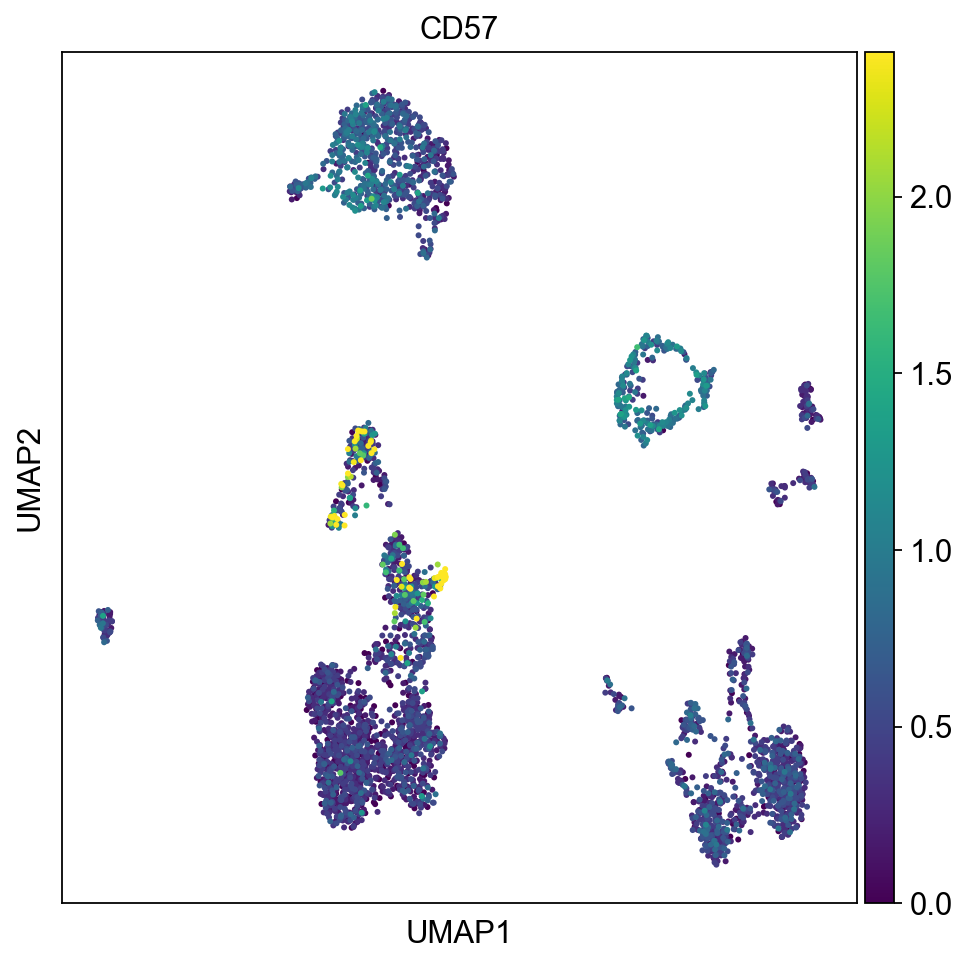

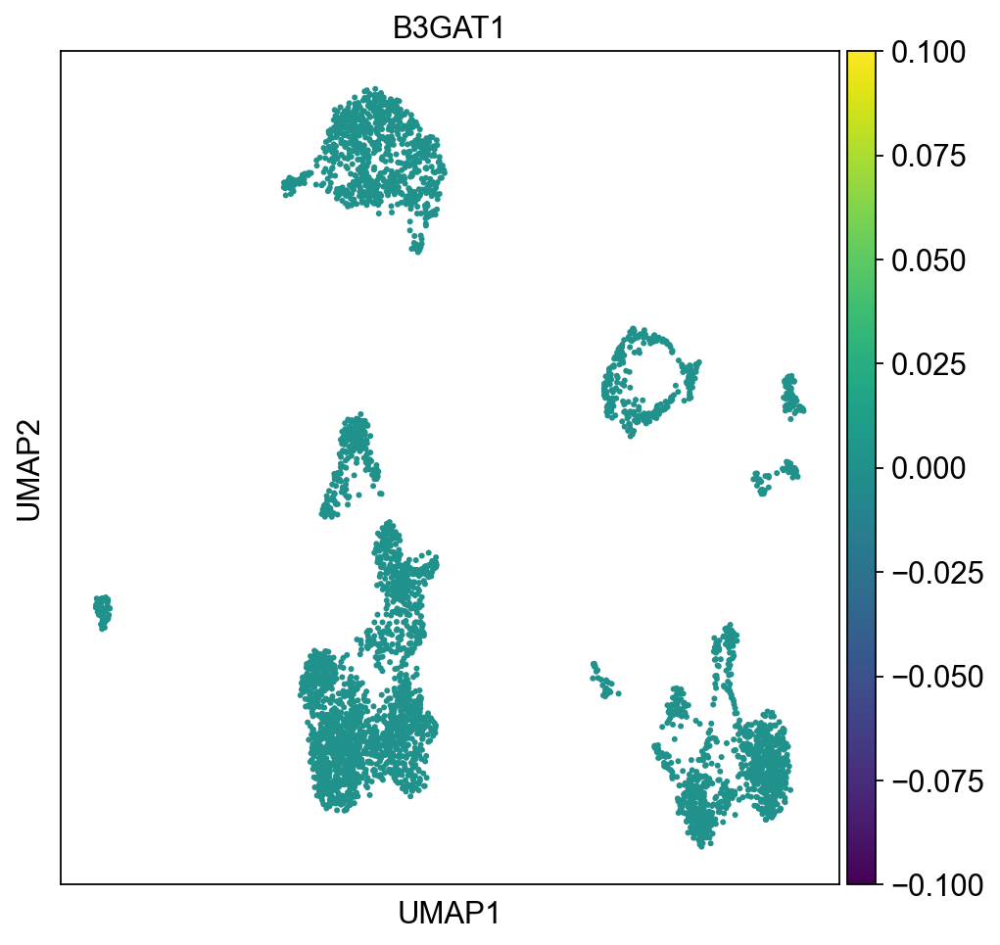

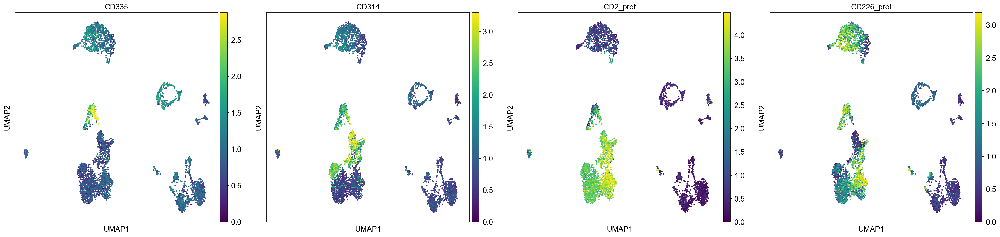

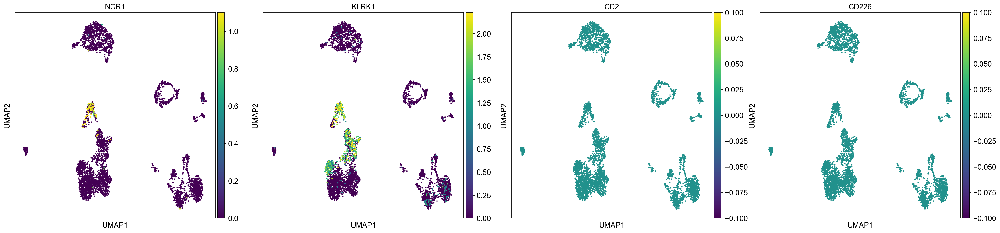

In [154]:
#One sample

sc.set_figure_params(figsize=(15, 10))
sc.pl.umap(s1d1, color = ['cell_type'], color_map = 'viridis')


#All cells, immature marker

sc.set_figure_params(figsize=(7, 7))
  
sc.pl.umap(eg, color = nk_immature, vmax="p99", color_map = 'viridis', ncols=3)

sc.pl.umap(eg, color = nk_immature_rna, vmax="p99", color_map = 'viridis')

#All cells, maturation marker

sc.pl.umap(eg, color = nk_maturation, vmax="p99", color_map = 'viridis')

sc.pl.umap(eg, color = nk_maturation_rna, vmax="p99", color_map = 'viridis')

#All cells, activating markers
    
sc.pl.umap(eg, color = nk_activating, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(eg, color = nk_activating_rna, vmax="p99", color_map = 'viridis')

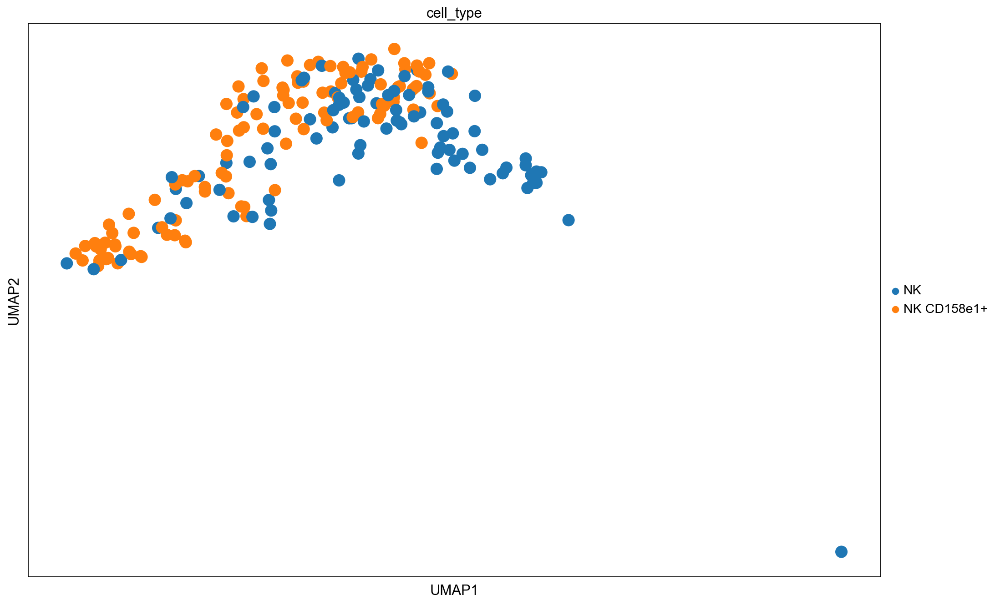

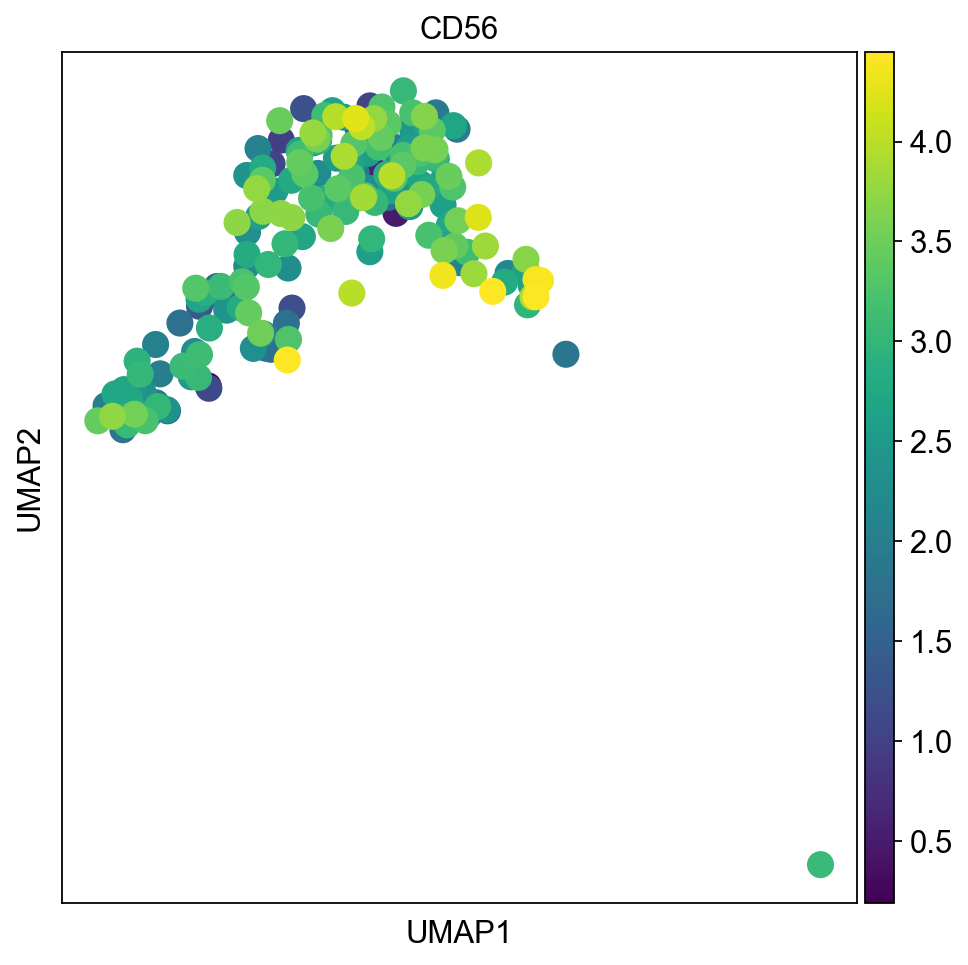

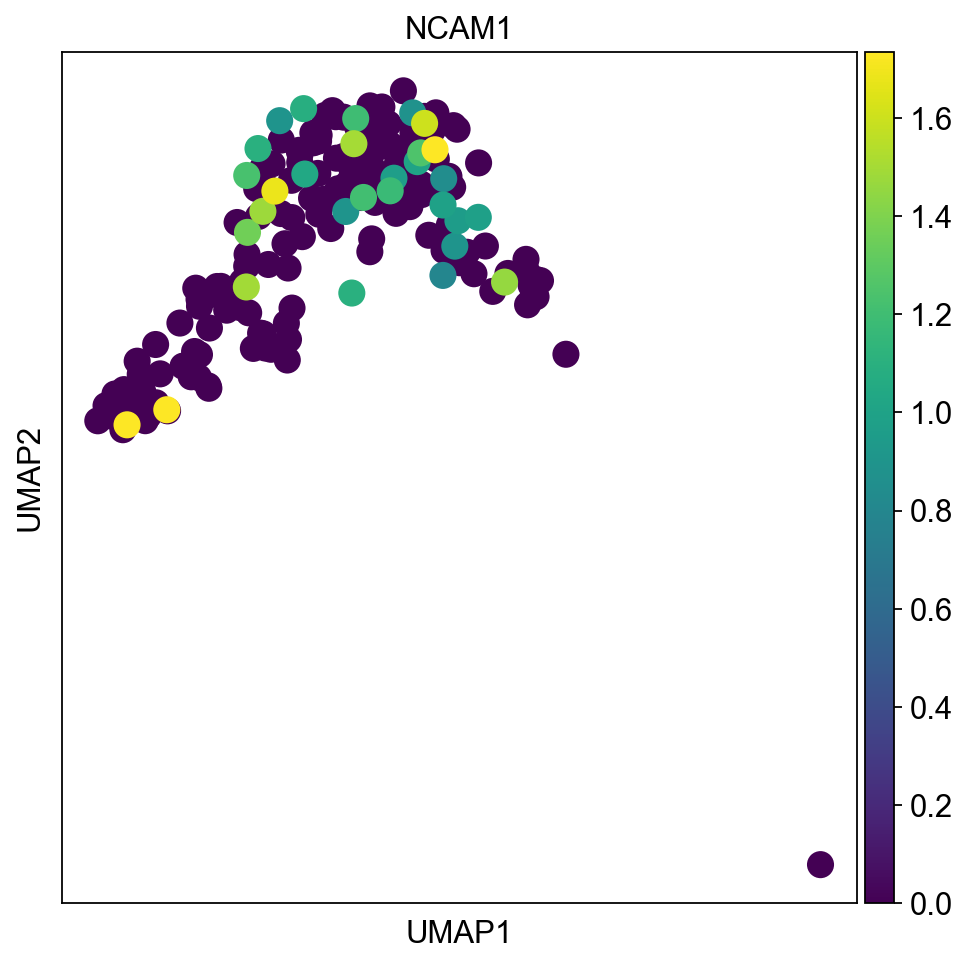

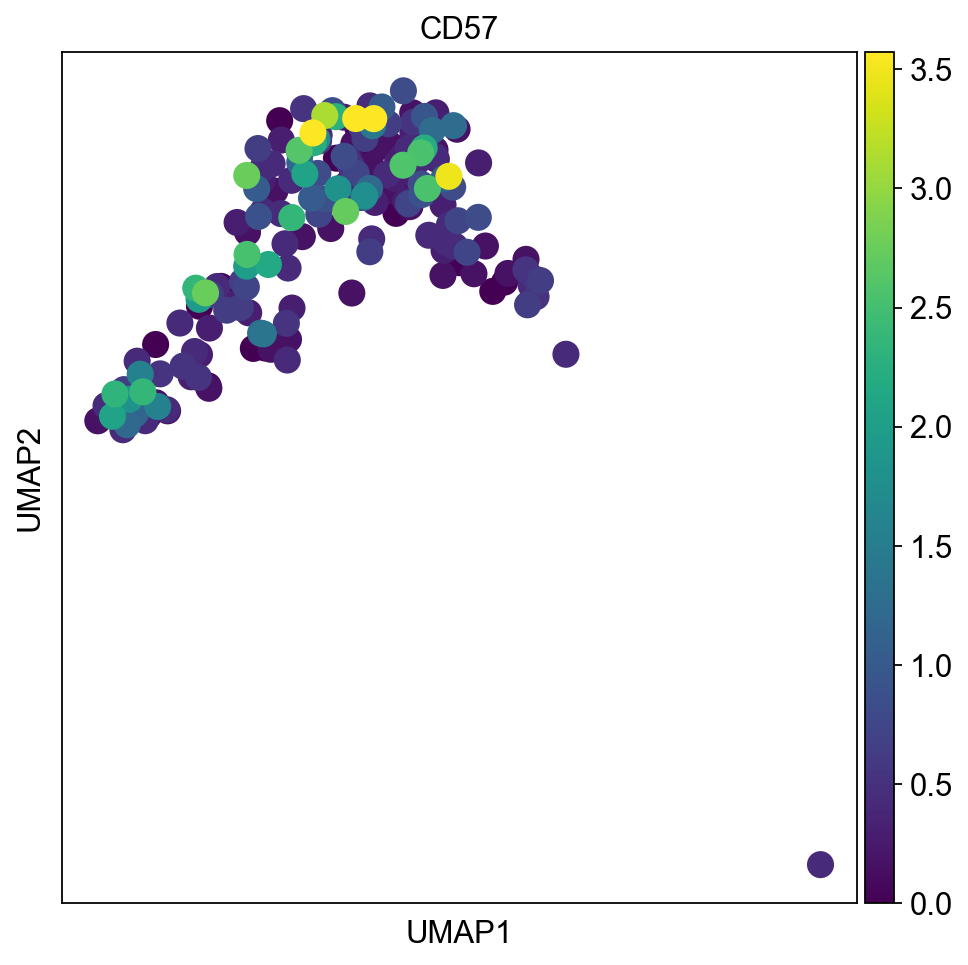

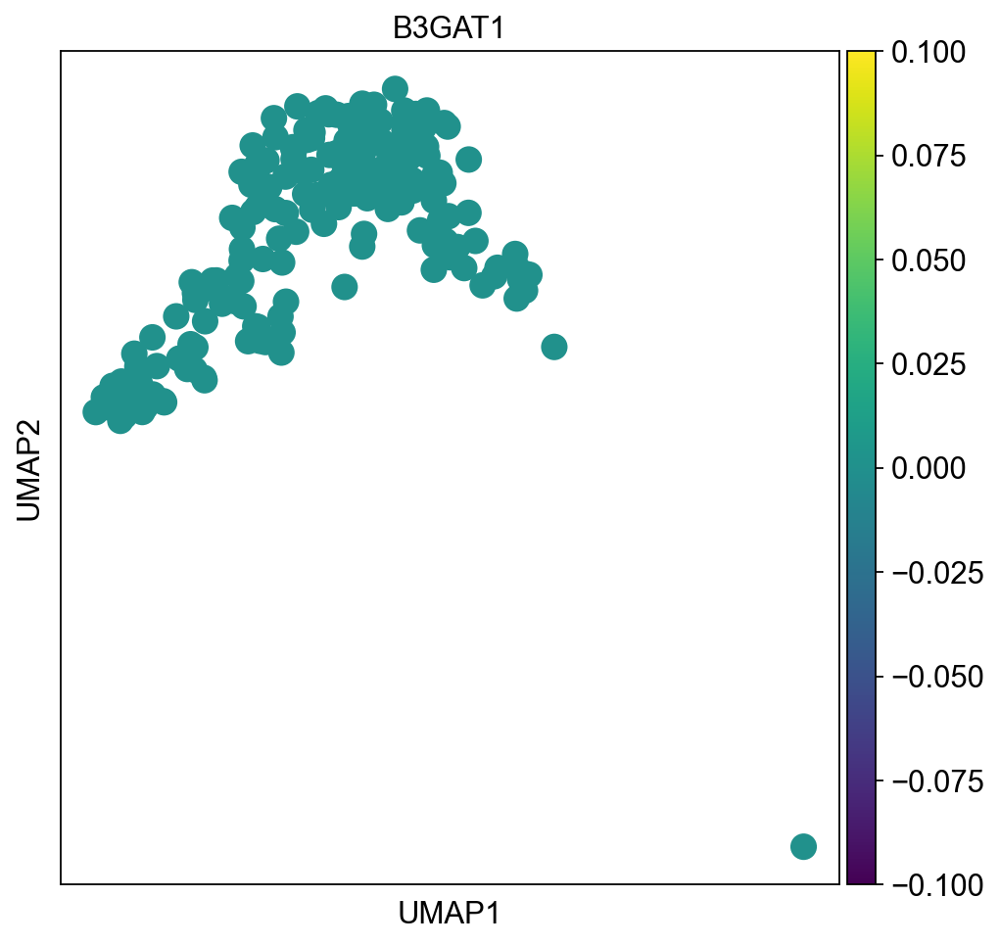

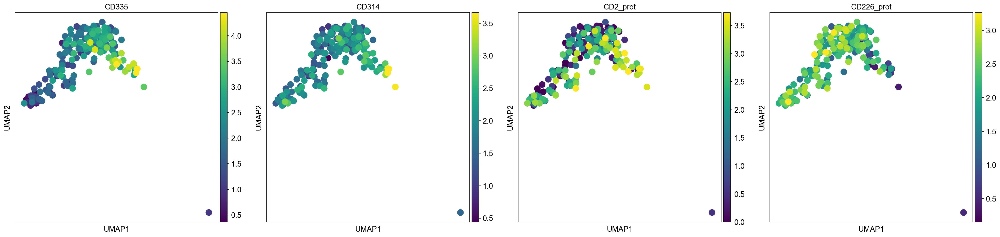

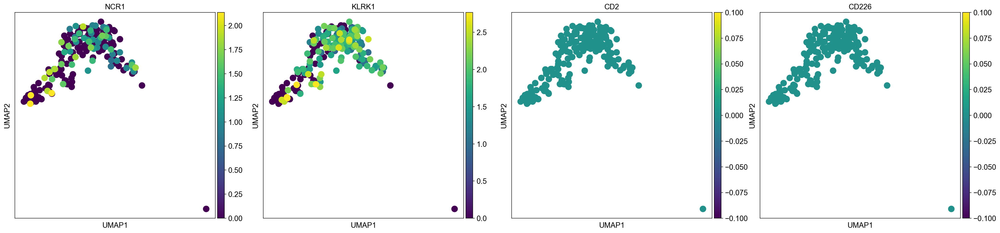

In [155]:

sc.set_figure_params(figsize=(15, 10))
sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')


#NK cells, immature marker

sc.set_figure_params(figsize=(7, 7))
  
sc.pl.umap(sample_nk, color = nk_immature, vmax="p99", color_map = 'viridis', ncols=3)

sc.pl.umap(sample_nk, color = nk_immature_rna, vmax="p99", color_map = 'viridis')

#NK cells, maturation marker

sc.pl.umap(sample_nk, color = nk_maturation, vmax="p99", color_map = 'viridis')

sc.pl.umap(sample_nk, color = nk_maturation_rna, vmax="p99", color_map = 'viridis')

#NK cells, activating markers
    
sc.pl.umap(sample_nk, color = nk_activating, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = nk_activating_rna, vmax="p99", color_map = 'viridis')



## Reference 2 markers

### Surface markers#

- nk_immature_pfef = ['CD56']
- nk56dim = ['CD94','CD158b', 'CD57']

- (nk_adaptive =['CD158b', 'CD159c, CD57'] CD159c not used in Neurips, so this is same as previous)


- nk_transition= ['TIGIT', 'CD155', 'CD226', 'CD161'] 

- c1_pfef = ['CD195', 'CD122', 'CD94']
- c2_pfef = ['CD62L', 'CD127', 'CD27', 'TIGIT']
- c3_pfef = ['CD16', 'CD38']

- pseudotime= ['CD161', 'CD94', 'CD56', 'CD5', 'CD7', 'CD122']

### Corresponding RNA #

- nk_immature_pfef_rna = ['NCAM1']
- nk56dim_pfef_rna = ['NKG2A', 'KIR2DL3', 'B3GAT1']


- nk_transition_rna= ['TIGIT', 'PVR', 'CD226', 'KLRB1']

- c1_pfef_rna = ['CCR5', 'IL2RB', 'KLRD1']
- c2_pfef_rna = ['SELL', 'IL7R', 'CD27', 'TIGIT']
- c3_pfef_rna = ['FCGR3A', 'CD38']

- pseudotime_rna= ['KLRB1', 'KLRD1', 'NCAM1', 'CD5', 'CD7', 'IL2RB']

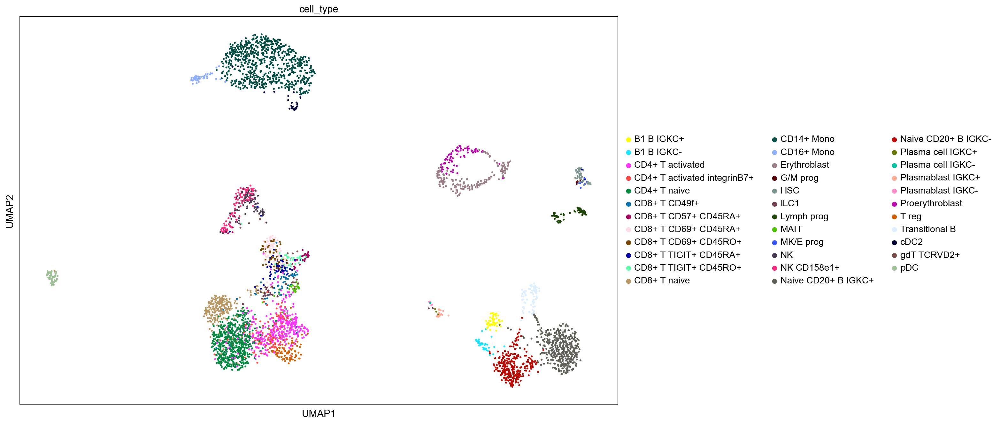

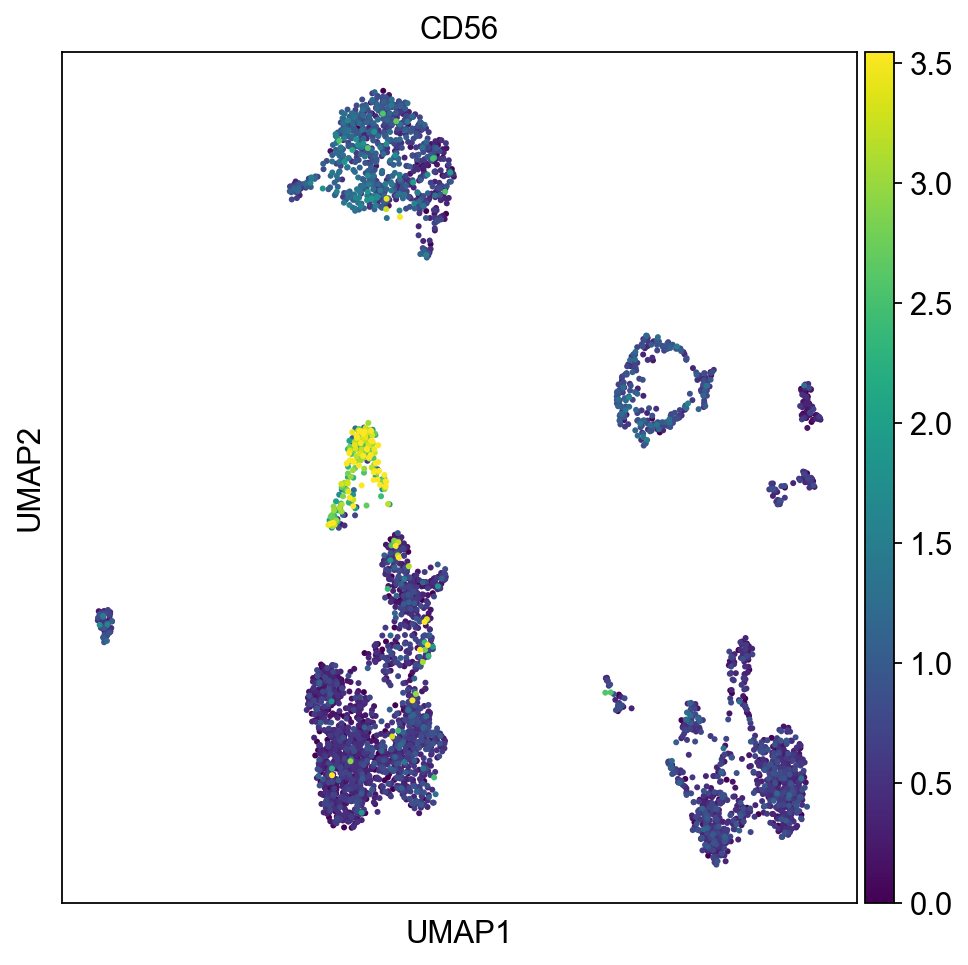

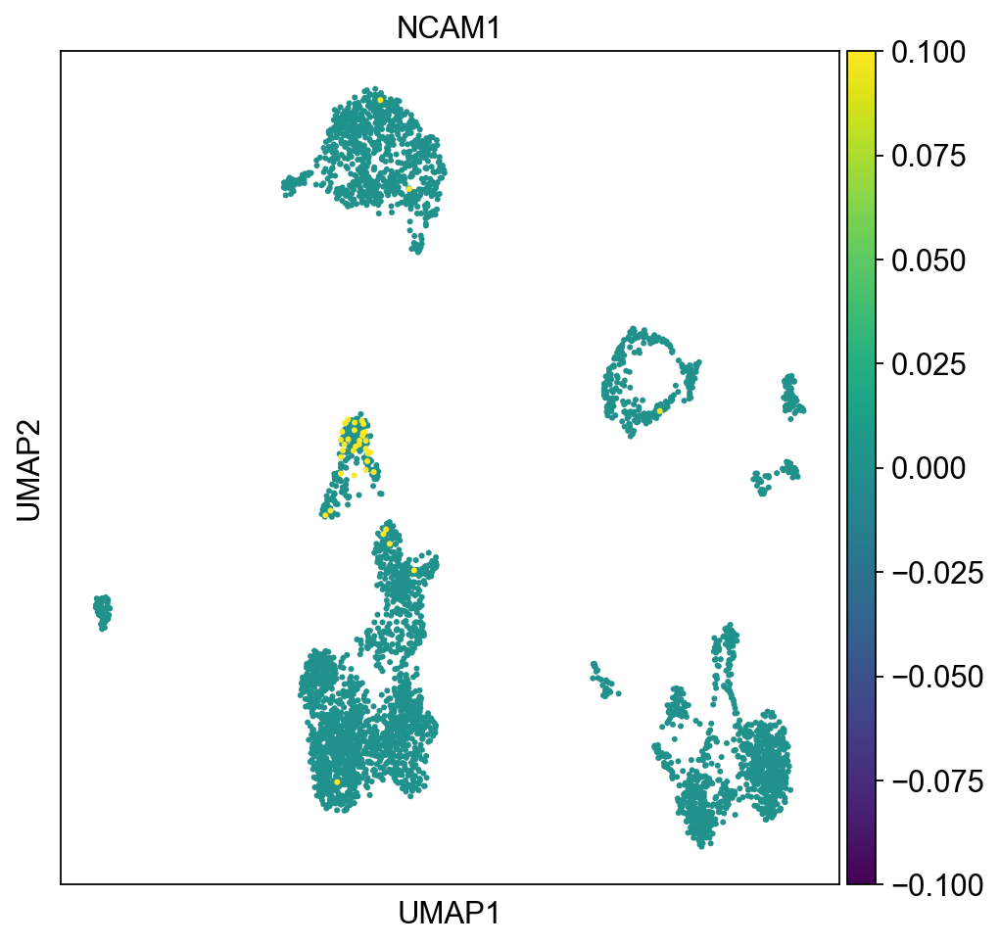

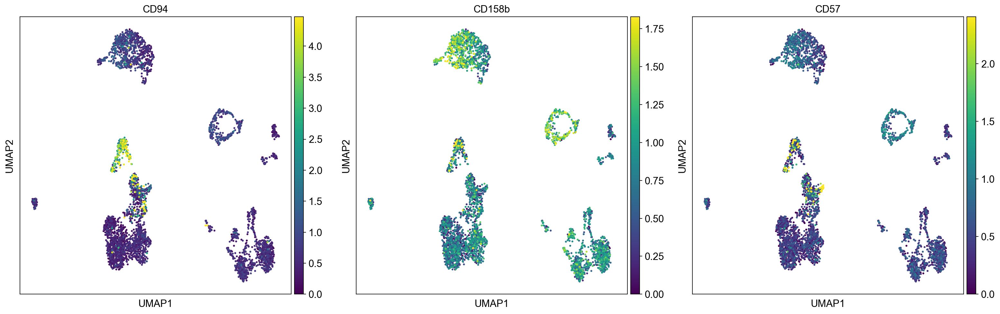

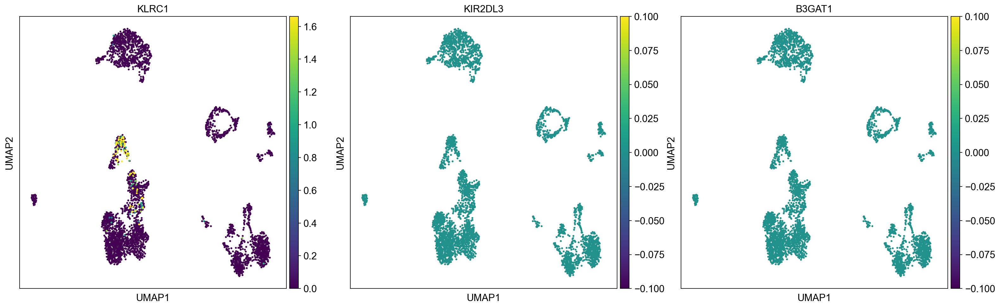

In [159]:
#All cell types, pfef markers

sc.set_figure_params(figsize=(15, 10))
sc.pl.umap(s1d1, color = ['cell_type'], color_map = 'viridis')

#NK immature

sc.set_figure_params(figsize=(7, 7))
sc.pl.umap(eg, color = nk_immature_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(eg, color = nk_immature_pfef_rna, vmax="p99", color_map = 'viridis')

#NK mature (adaptive)

sc.pl.umap(eg, color = nk56dim, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(eg, color = nk56dim_pfef_rna, vmax="p99", color_map = 'viridis')

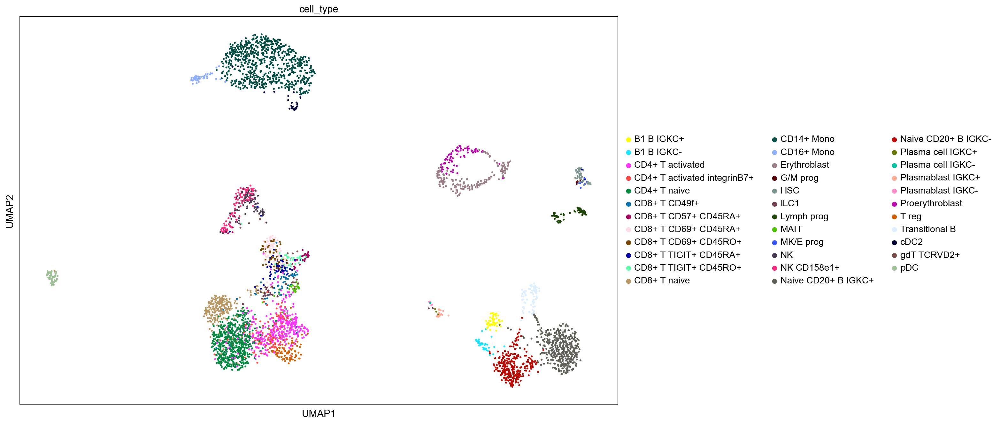

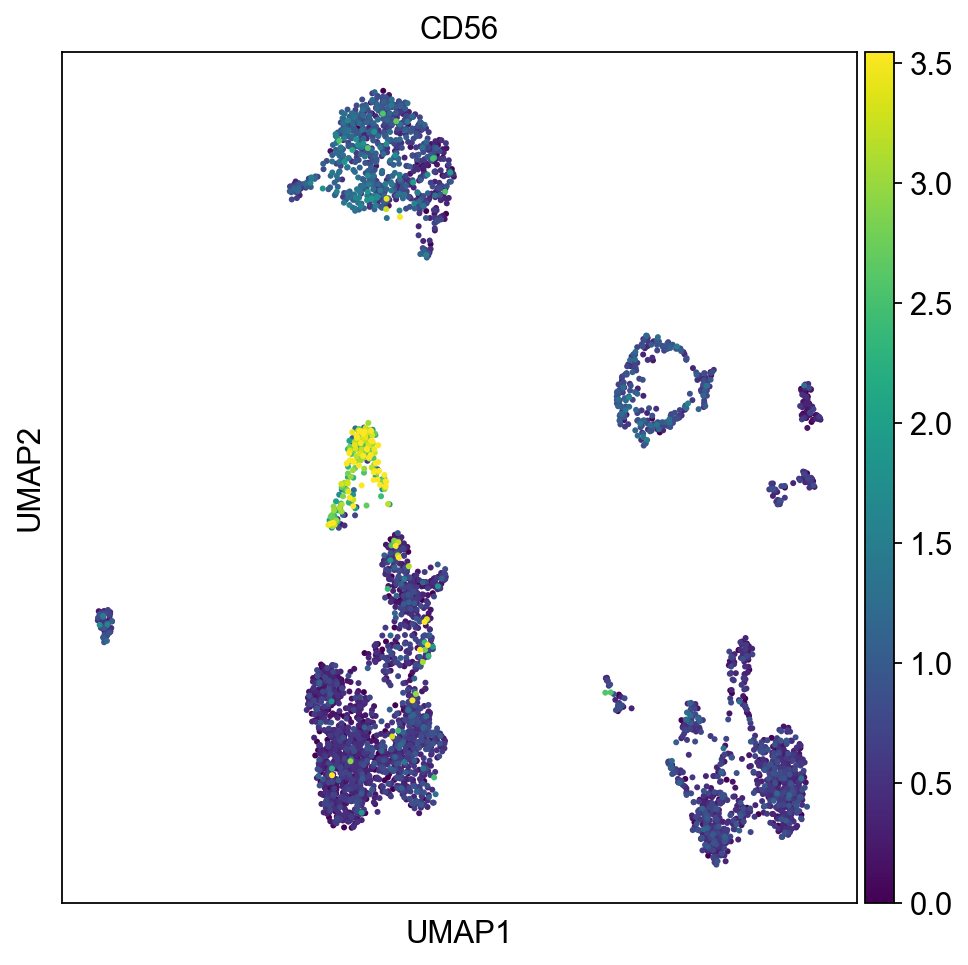

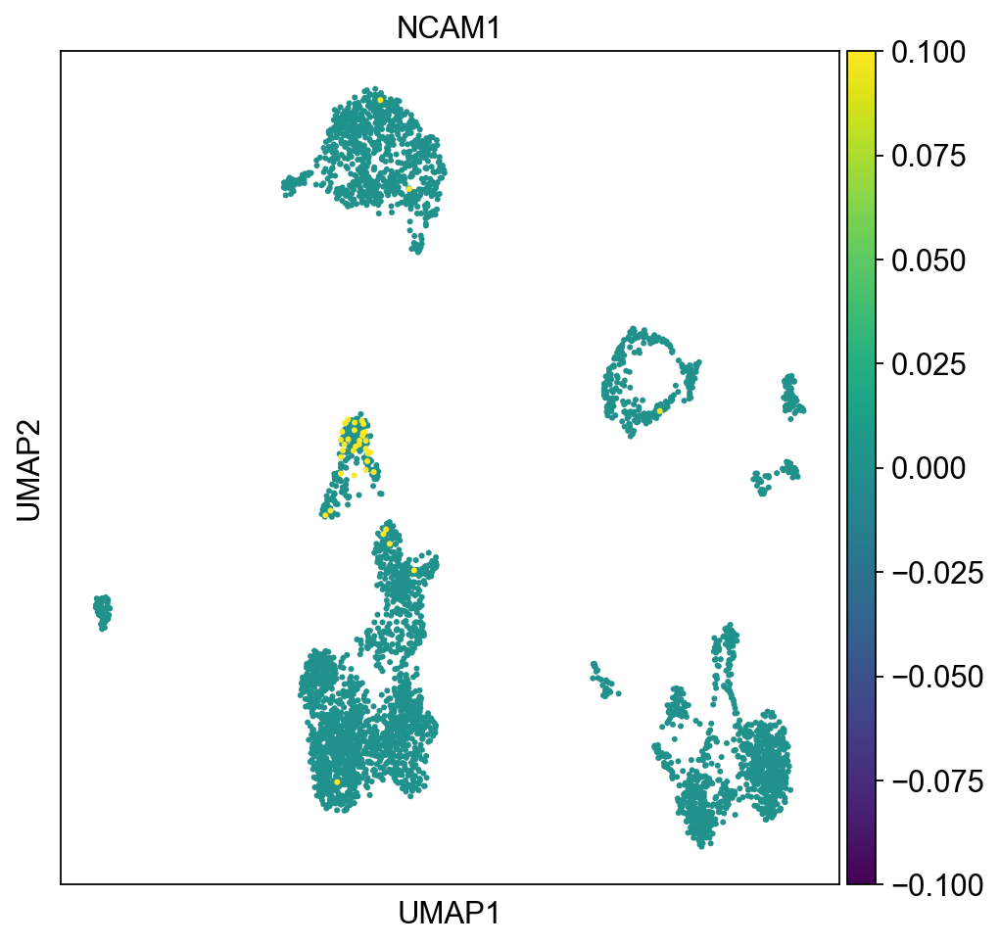

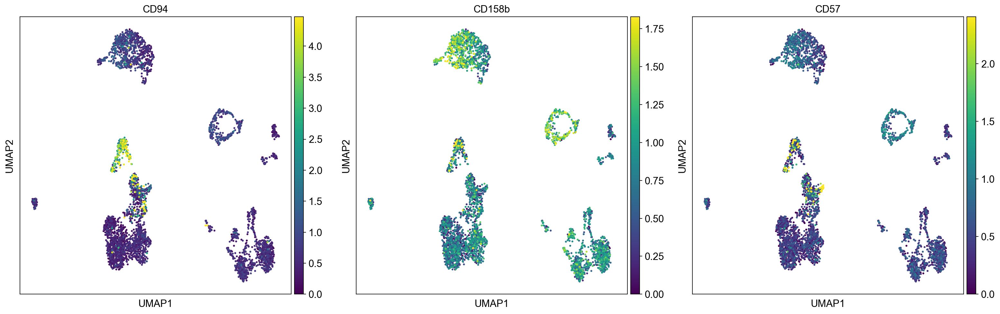

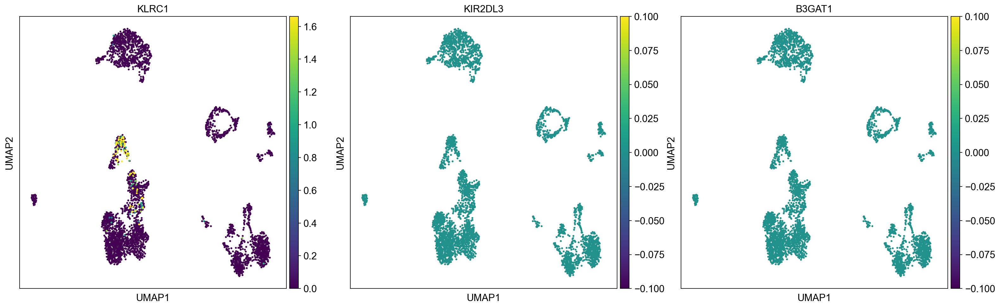

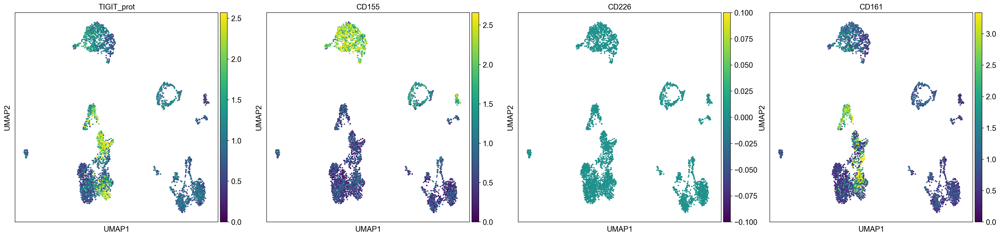

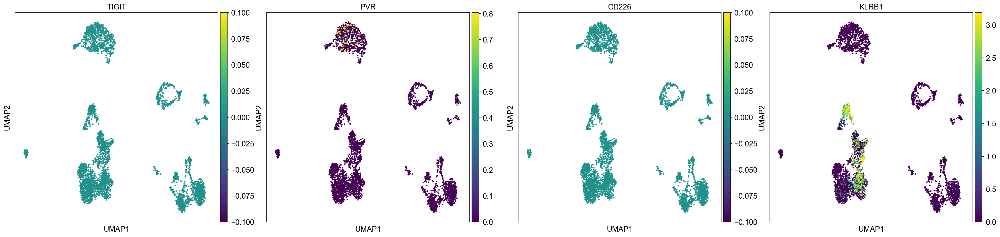

In [163]:
#All cell types, pfef markers

sc.set_figure_params(figsize=(15, 10))
sc.pl.umap(eg, color = ['cell_type'], color_map = 'viridis')

#NK immature

sc.set_figure_params(figsize=(7, 7))
sc.pl.umap(eg, color = nk_immature_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(eg, color = nk_immature_pfef_rna, vmax="p99", color_map = 'viridis')

#NK mature (adaptive)

sc.pl.umap(eg, color = nk56dim, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(eg, color = nk56dim_pfef_rna, vmax="p99", color_map = 'viridis')

#Transition from CD56 to CD57

sc.pl.umap(eg, color = nk_transition, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(eg, color = nk_transition_rna, vmax="p99", color_map = 'viridis')




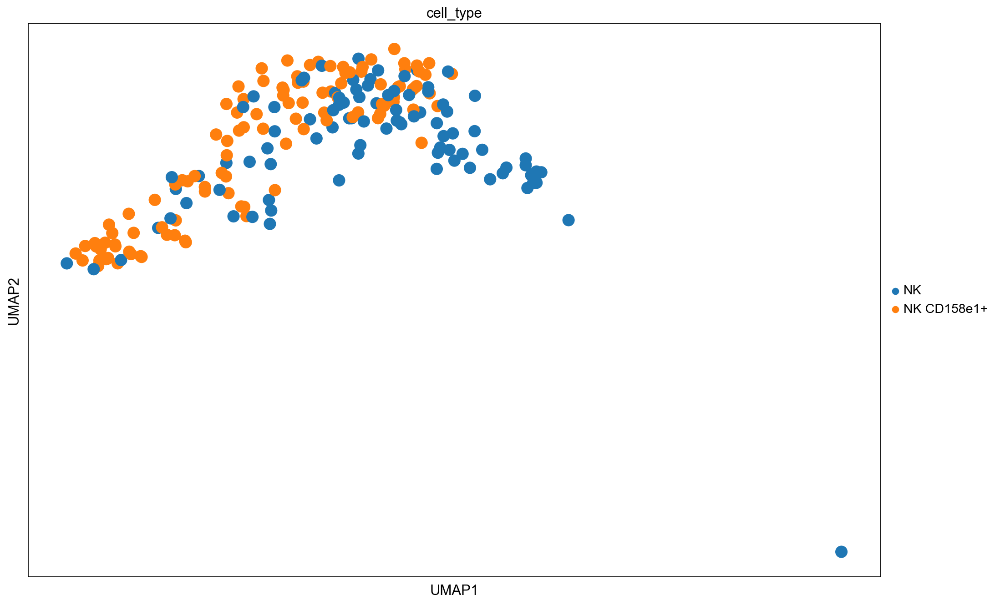

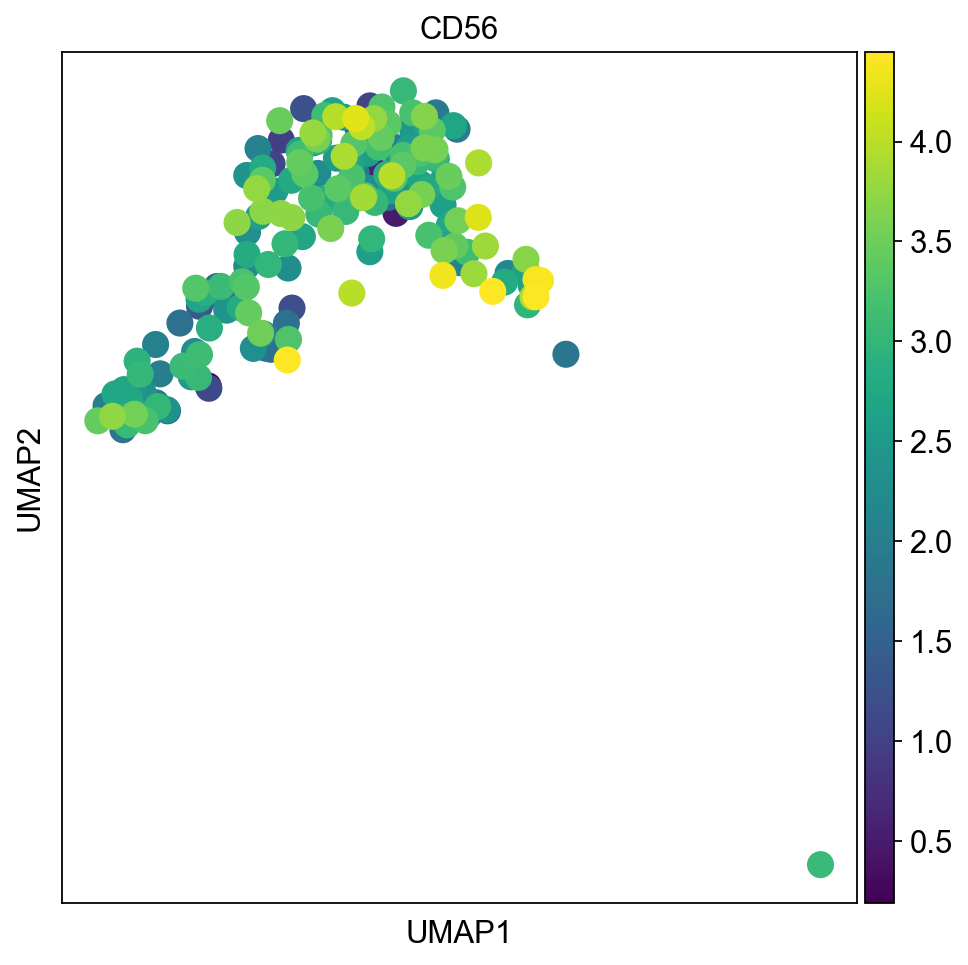

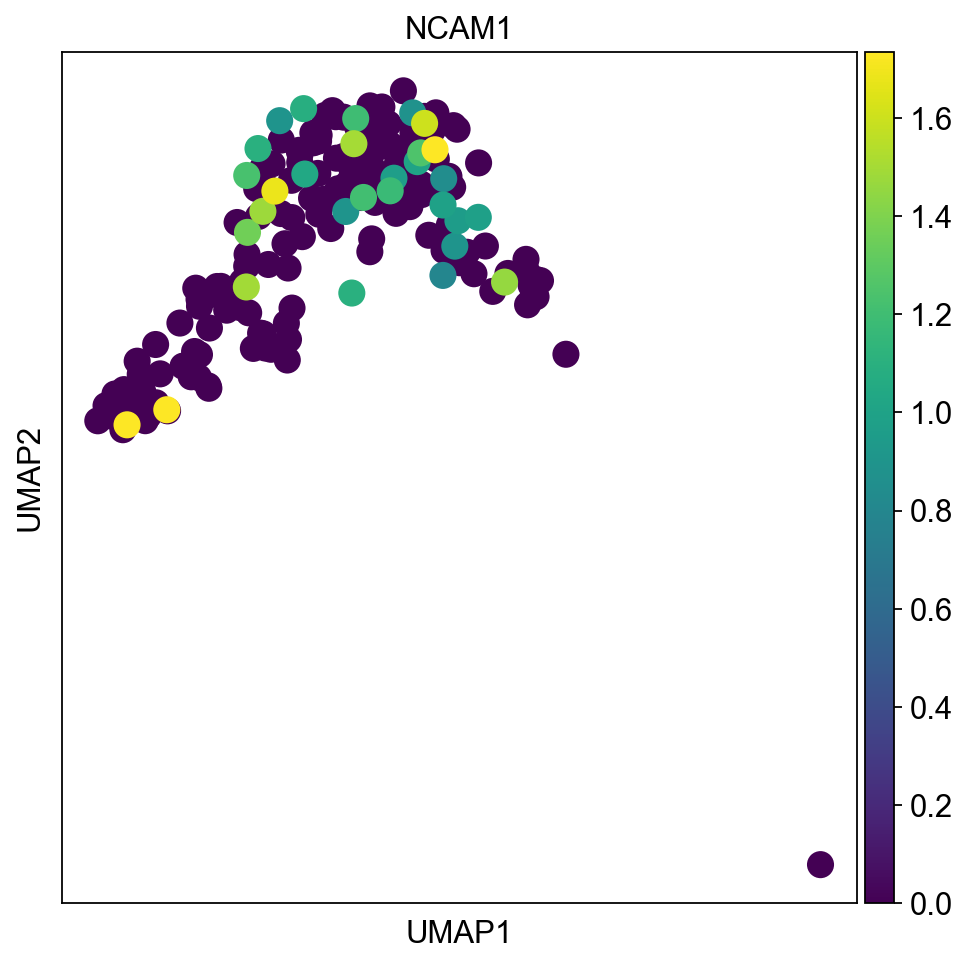

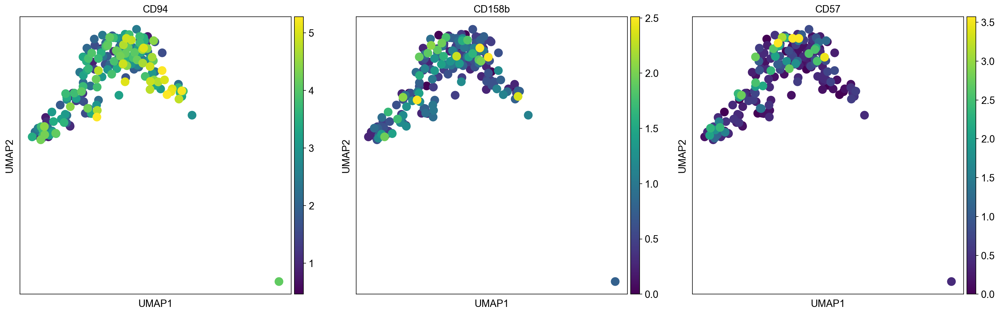

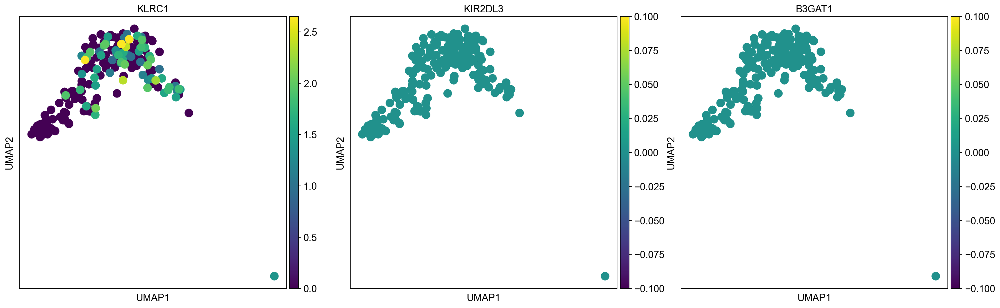

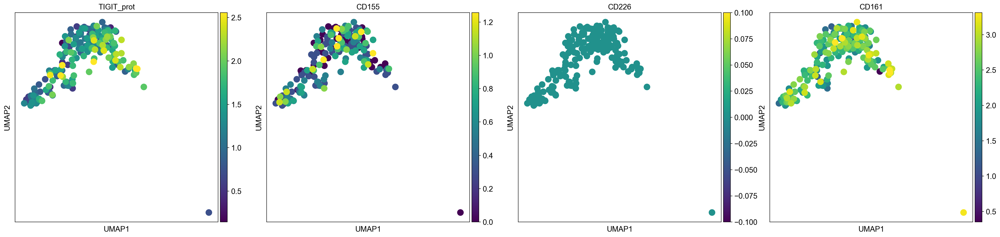

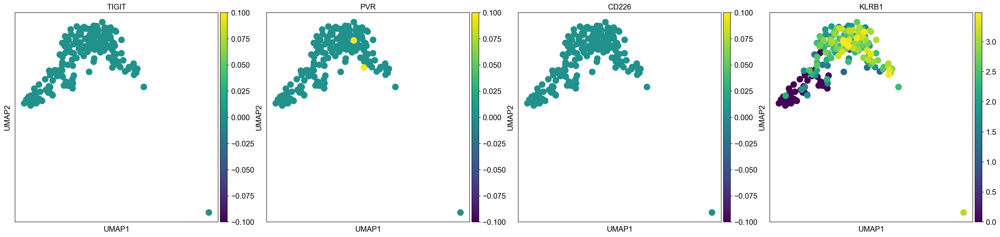

In [162]:
#All cell types, pfef markers

sc.set_figure_params(figsize=(15, 10))
sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#NK immature

sc.set_figure_params(figsize=(7, 7))
sc.pl.umap(sample_nk, color = nk_immature_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = nk_immature_pfef_rna, vmax="p99", color_map = 'viridis')

#NK mature (adaptive)

sc.pl.umap(sample_nk, color = nk56dim, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = nk56dim_pfef_rna, vmax="p99", color_map = 'viridis')

#Transition from CD56 to CD57

sc.pl.umap(sample_nk, color = nk_transition, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = nk_transition_rna, vmax="p99", color_map = 'viridis')




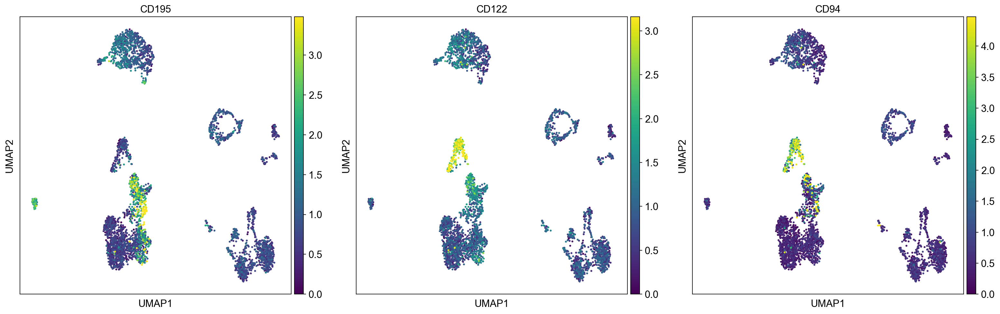

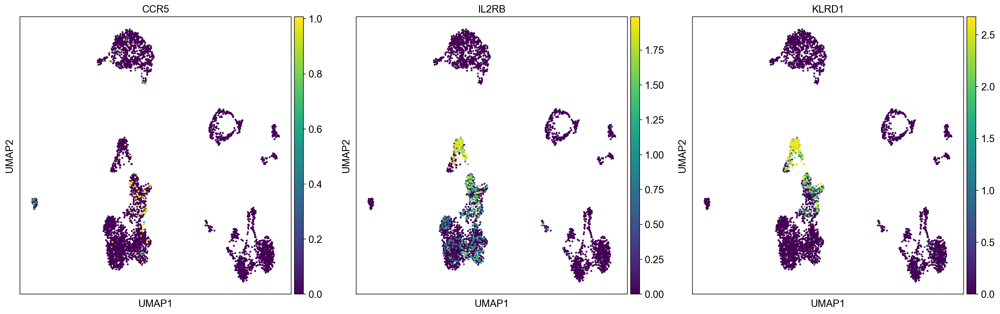

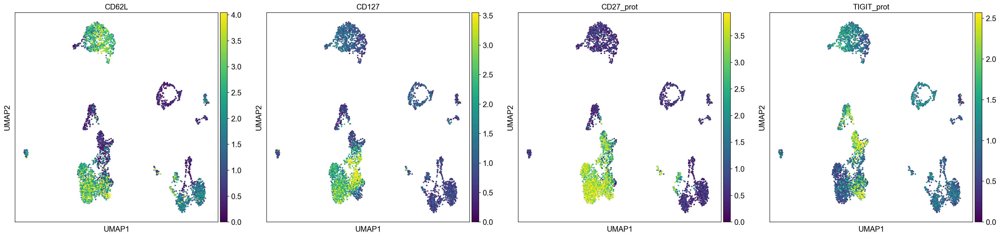

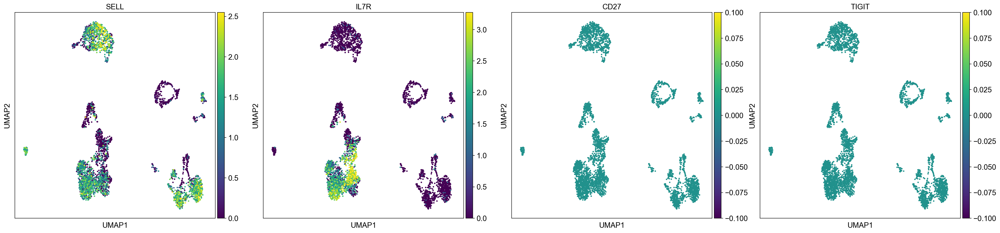

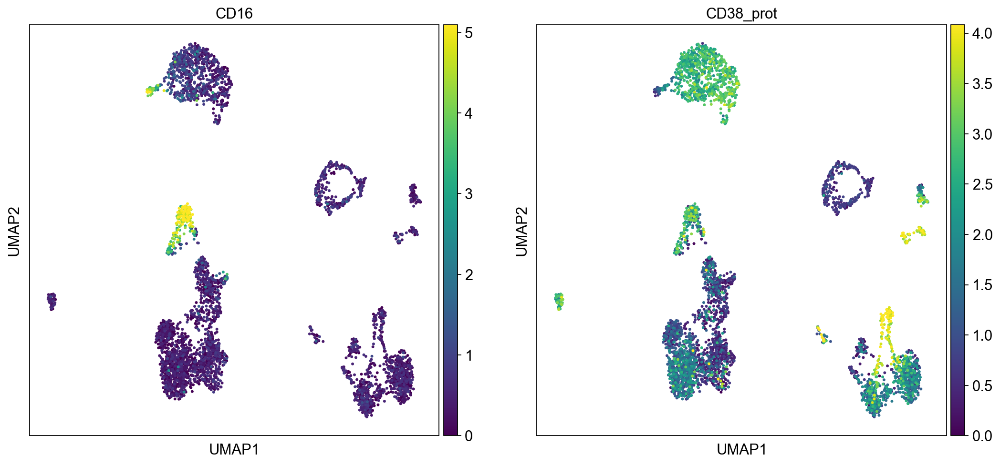

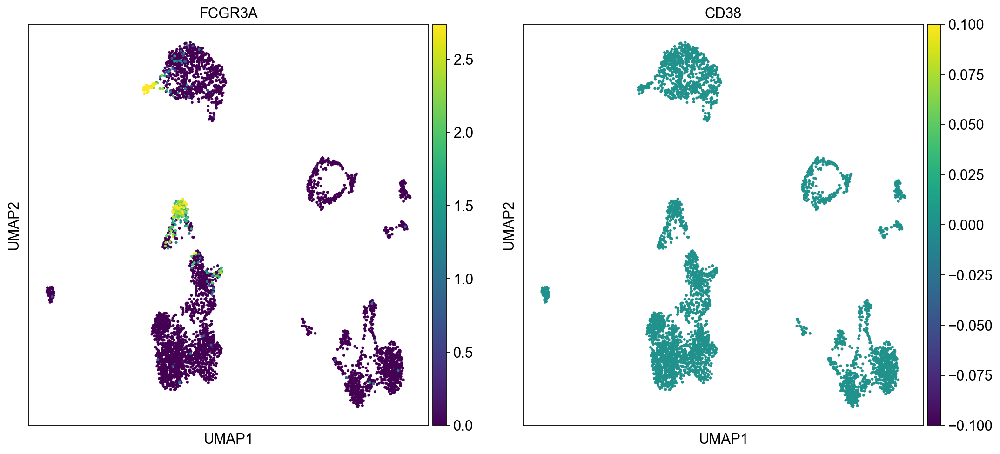

In [164]:
#Clusters 1-3 by Pfef

#Cluster 1 (most mature)

sc.pl.umap(eg, color = c1_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(eg, color = c1_pfef_rna, vmax="p99", color_map = 'viridis')

#Cluster 2

sc.pl.umap(eg, color = c2_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(eg, color = c2_pfef_rna, vmax="p99", color_map = 'viridis')

#Cluster 3

sc.pl.umap(eg, color = c3_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(eg, color = c3_pfef_rna, vmax="p99", color_map = 'viridis')

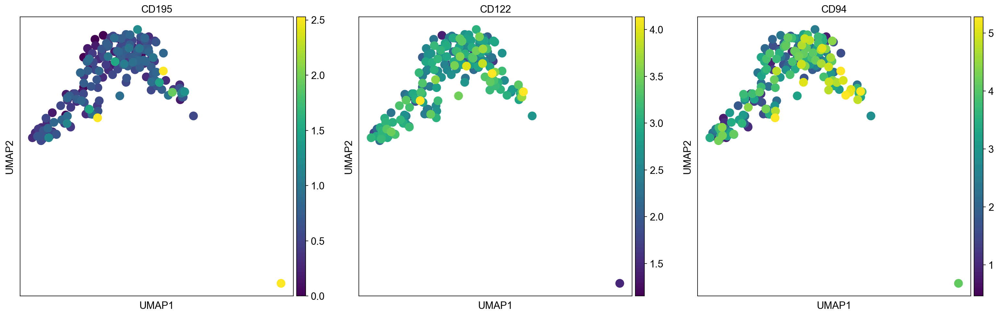

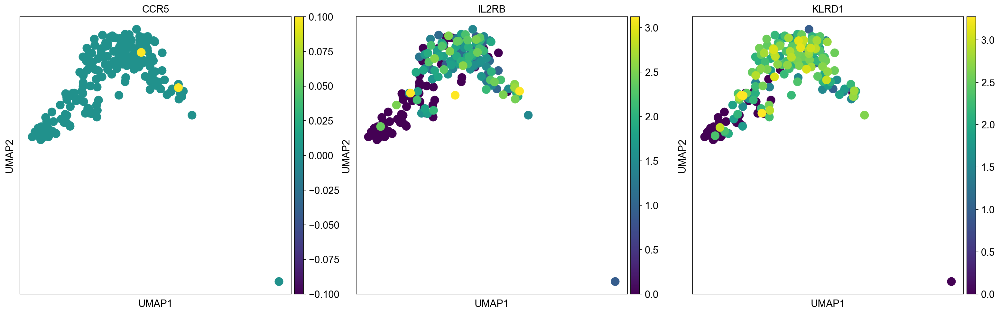

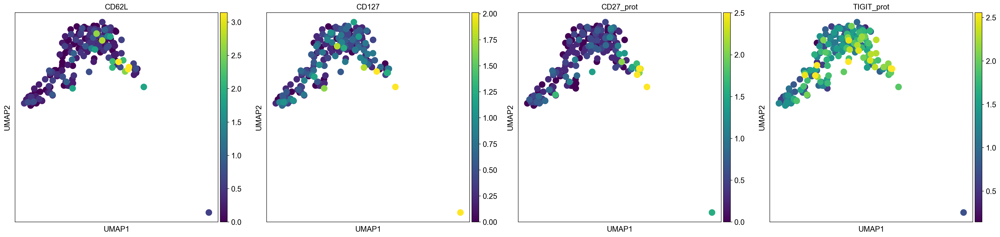

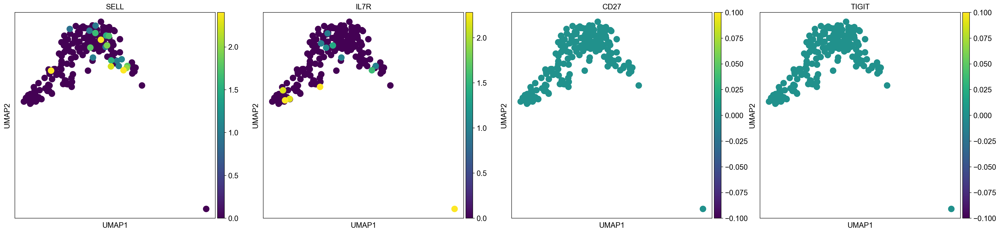

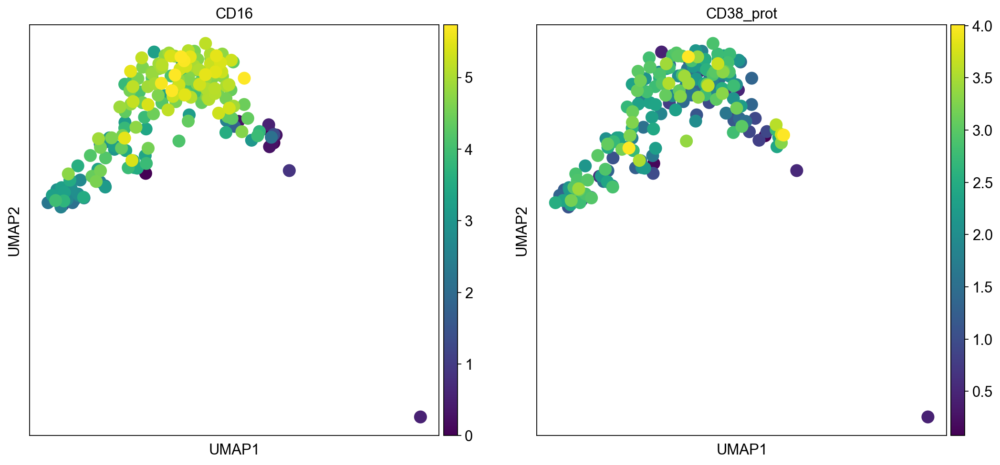

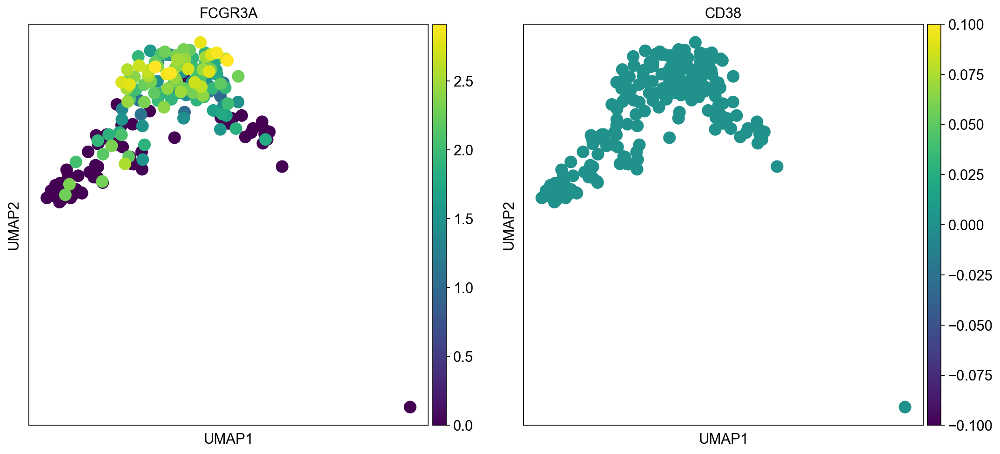

In [165]:
#c1_pfef = ['CD195', 'CD122', 'CD94']
#c2_pfef = ['CD62L', 'CD127', 'CD27', 'TIGIT']
#c3_pfef = ['CD16', 'CD38']


#c1_pfef_rna = ['CCR5', 'IL2RB', 'KLRD1']
#c2_pfef_rna = ['SELL', 'IL7R', 'CD27', 'TIGIT']
#c3_pfef_rna = ['FCGR3A', 'CD38']



#Clusters 1-3 by Pfef

#Cluster 1 (most mature)

sc.pl.umap(sample_nk, color = c1_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = c1_pfef_rna, vmax="p99", color_map = 'viridis')

#Cluster 2

sc.pl.umap(sample_nk, color = c2_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = c2_pfef_rna, vmax="p99", color_map = 'viridis')

#Cluster 3

sc.pl.umap(sample_nk, color = c3_pfef, vmax="p99", color_map = 'viridis')
    
sc.pl.umap(sample_nk, color = c3_pfef_rna, vmax="p99", color_map = 'viridis')